In [1]:
# pip install mlflow boto3 awscli optuna imbalanced-learn lightgbm
#! pip install plotly

In [2]:
import mlflow
# step 1 : Set up the mlflow tracking server 
mlflow.set_tracking_uri("http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/")

In [3]:
mlflow.set_experiment("EXP-6 LightGBM(best_model) HP Tuning")

2025/11/22 19:53:32 INFO mlflow.tracking.fluent: Experiment with name 'EXP-6 LightGBM(best_model) HP Tuning' does not exist. Creating a new experiment.


<Experiment: artifact_location='s3://youtube-recommender-exp-bucket/6', creation_time=1763821412498, experiment_id='6', last_update_time=1763821412498, lifecycle_stage='active', name='EXP-6 LightGBM(best_model) HP Tuning', tags={}>

In [4]:
import optuna
import mlflow
import mlflow.sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,f1_score
from sklearn.feature_extraction.text import CountVectorizer
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from optuna.visualization import matplotlib as vis

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
df = pd.read_csv(r'C:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_preprocessing.csv').dropna(subset=['clean_comment'])
df.shape

(36662, 2)

In [6]:
# Step 1: Remap the class labels from [-1, 0, 1] to [2, 0, 1]
df['category'] = df['category'].map({-1: 2, 0: 0, 1: 1})

# Step 2: Remove rows where the target labels (category) are NaN
df = df.dropna(subset=['category'])

#step 3: BOW setup with train test split
ngram_range = (1,3) 
max_features = 1000 

X_train,X_test,y_train,y_test = train_test_split(df['clean_comment'],df['category'],test_size=0.2,random_state=42,stratify=df['category'])

vectorizer = CountVectorizer(ngram_range=ngram_range,max_features=max_features)
X_train_vec= vectorizer.fit_transform(X_train).astype(np.float32)
X_test_vec = vectorizer.transform(X_test).astype(np.float32)

# use undersampler to handle Imbalanced data
rus = RandomUnderSampler(random_state=42)
X_train_vec,y_train = rus.fit_resample(X_train_vec,y_train)
X_train_vec = X_train_vec.astype(np.float32)

#Function to log results in MLflow
def log_mlflow_trial(model_name,params,metrics,trial_number):
    # FIXED: Separate MLflow run per trial (avoid retraining full data)
        # Log model type and trial number
    with mlflow.start_run(run_name=f"Trial_{trial_number}_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        mlflow.log_metric("val_accuracy", metrics)

def log_mlflow_best(model_name, model, X_train, X_test, y_train, y_test, params):
    # FIXED: Log best model trained on full data separately
     with mlflow.start_run(run_name=f"Best_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        y_pred = model.predict(X_test)
        test_acc = accuracy_score(y_test, y_pred)
        mlflow.log_metric("test_accuracy", test_acc)    

        # Log classification report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)
        for label, metrics in classification_rep.items():
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{label}_{metric}", value)

        # Log the model
        mlflow.sklearn.log_model(model, f"{model_name}_model")

    

[I 2025-11-22 19:53:39,722] A new study created in memory with name: no-name-fcd23727-97f5-4335-90c4-cacfcd112b0f


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3087
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 666
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_0_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/26f2a4bc7ce549c4bf09c9cd2330ee41
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:53:45,978] Trial 0 finished with value: 0.6476382924981056 and parameters: {'n_estimators': 629, 'learning_rate': 0.002253385614017764, 'max_depth': 8, 'num_leaves': 140, 'min_child_samples': 70, 'colsample_bytree': 0.6500511657116071, 'subsample': 0.663260930401292, 'reg_alpha': 0.027732523768620274, 'reg_lambda': 0.4740260411379929}. Best is trial 0 with value: 0.6476382924981056.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_1_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ac4e97ff8aa84420b6fbf96d7c405864
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:53:49,506] Trial 1 finished with value: 0.6231371558474362 and parameters: {'n_estimators': 737, 'learning_rate': 0.0042569199335061765, 'max_depth': 3, 'num_leaves': 61, 'min_child_samples': 31, 'colsample_bytree': 0.8294705049561335, 'subsample': 0.761964921718522, 'reg_alpha': 0.1112293527991139, 'reg_lambda': 3.538867636298378}. Best is trial 0 with value: 0.6476382924981056.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3474
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 771
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_2_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/cbdfdf3b976b4734b1070f6f57973625
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:53:52,767] Trial 2 finished with value: 0.7517049760040414 and parameters: {'n_estimators': 272, 'learning_rate': 0.07990133869401748, 'max_depth': 14, 'num_leaves': 123, 'min_child_samples': 62, 'colsample_bytree': 0.9569496215022872, 'subsample': 0.6985019669030714, 'reg_alpha': 0.000105176117500304, 'reg_lambda': 0.00035018135653073243}. Best is trial 2 with value: 0.7517049760040414.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2259
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 459
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_3_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/52bf3e1224204efabce5e4e3f2f38a61
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:53:56,475] Trial 3 finished with value: 0.6693609497347816 and parameters: {'n_estimators': 302, 'learning_rate': 0.004304084576069702, 'max_depth': 12, 'num_leaves': 64, 'min_child_samples': 98, 'colsample_bytree': 0.6111261175334806, 'subsample': 0.7348121329042452, 'reg_alpha': 0.00120620593807877, 'reg_lambda': 0.19895677104253426}. Best is trial 2 with value: 0.7517049760040414.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020998 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4186
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 955
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_4_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/05ed4159474c4adc98dded7469056366
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:00,780] Trial 4 finished with value: 0.5804496084869917 and parameters: {'n_estimators': 569, 'learning_rate': 0.0005479374887990094, 'max_depth': 6, 'num_leaves': 140, 'min_child_samples': 37, 'colsample_bytree': 0.9406819304311298, 'subsample': 0.6150026857410835, 'reg_alpha': 3.3796293720391066, 'reg_lambda': 0.00030277412984740313}. Best is trial 2 with value: 0.7517049760040414.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2837
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 601
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_5_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/04377fe5b3324c9c82d9fdc6fbe30da7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:06,115] Trial 5 finished with value: 0.7274564283910079 and parameters: {'n_estimators': 525, 'learning_rate': 0.006349793662554427, 'max_depth': 15, 'num_leaves': 108, 'min_child_samples': 78, 'colsample_bytree': 0.674536063821138, 'subsample': 0.804462372047624, 'reg_alpha': 0.010176682356765826, 'reg_lambda': 0.023852495776599838}. Best is trial 2 with value: 0.7517049760040414.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4061
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 925
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_6_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/89954d00fc064d2cad4a2ff88357aa3e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:10,192] Trial 6 finished with value: 0.7557464006062137 and parameters: {'n_estimators': 441, 'learning_rate': 0.030721274105775166, 'max_depth': 13, 'num_leaves': 63, 'min_child_samples': 45, 'colsample_bytree': 0.9274985835633045, 'subsample': 0.5477522876532626, 'reg_alpha': 6.052614916932368, 'reg_lambda': 0.5208371276904545}. Best is trial 6 with value: 0.7557464006062137.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2492
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 514
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_7_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ea73049816894ae78f0e07eed0d08d81
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:14,742] Trial 7 finished with value: 0.5925738822935085 and parameters: {'n_estimators': 467, 'learning_rate': 0.00038731268217655066, 'max_depth': 5, 'num_leaves': 141, 'min_child_samples': 89, 'colsample_bytree': 0.7231661545675847, 'subsample': 0.9972159386235926, 'reg_alpha': 0.002566688797846708, 'reg_lambda': 0.03592687961026585}. Best is trial 6 with value: 0.7557464006062137.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_8_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/66a931db2c8342498892115e6c810003
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:27,430] Trial 8 finished with value: 0.6067188684011114 and parameters: {'n_estimators': 833, 'learning_rate': 0.0005268059300673794, 'max_depth': 5, 'num_leaves': 130, 'min_child_samples': 19, 'colsample_bytree': 0.5979739058723517, 'subsample': 0.5710229673480848, 'reg_alpha': 2.695738595288365, 'reg_lambda': 0.00012067830981348202}. Best is trial 6 with value: 0.7557464006062137.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2724
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 573
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_9_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/dc798d88eb254389b390fcaab5b8e950
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:35,793] Trial 9 finished with value: 0.601667087648396 and parameters: {'n_estimators': 615, 'learning_rate': 0.0008722011872967731, 'max_depth': 5, 'num_leaves': 25, 'min_child_samples': 81, 'colsample_bytree': 0.6732948153756662, 'subsample': 0.7596076392224462, 'reg_alpha': 0.002348636316536463, 'reg_lambda': 0.0011401181123927779}. Best is trial 6 with value: 0.7557464006062137.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4031
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 917
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_10_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/8287a51a4c8c429c80abe83149db5155
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:38,802] Trial 10 finished with value: 0.7234150037888356 and parameters: {'n_estimators': 123, 'learning_rate': 0.041734969483612216, 'max_depth': 11, 'num_leaves': 25, 'min_child_samples': 48, 'colsample_bytree': 0.8452760231296931, 'subsample': 0.5068461915228726, 'reg_alpha': 0.34547939469961836, 'reg_lambda': 9.693032613875008}. Best is trial 6 with value: 0.7557464006062137.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3575
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 796
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_11_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/4743e0ac2f6e407bbfee8b0ea9563195
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:43,450] Trial 11 finished with value: 0.756504167719121 and parameters: {'n_estimators': 283, 'learning_rate': 0.0794454573116908, 'max_depth': 15, 'num_leaves': 93, 'min_child_samples': 60, 'colsample_bytree': 0.9959775075940828, 'subsample': 0.8949723993494114, 'reg_alpha': 0.0001402897848821901, 'reg_lambda': 0.0060155269714119415}. Best is trial 11 with value: 0.756504167719121.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4002
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 909
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_12_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e71e2f9048444a5e8b5882647a3543b3
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:48,087] Trial 12 finished with value: 0.7580197019449356 and parameters: {'n_estimators': 345, 'learning_rate': 0.0229070504759453, 'max_depth': 13, 'num_leaves': 86, 'min_child_samples': 49, 'colsample_bytree': 0.9983576249035807, 'subsample': 0.8882631147130523, 'reg_alpha': 0.00016986975653520315, 'reg_lambda': 0.005311975992497707}. Best is trial 12 with value: 0.7580197019449356.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3343
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 734
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_13_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ecbffaec201d4cf19ac179b657d5ffe9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:54,249] Trial 13 finished with value: 0.706744127304875 and parameters: {'n_estimators': 281, 'learning_rate': 0.011492134911062135, 'max_depth': 10, 'num_leaves': 91, 'min_child_samples': 64, 'colsample_bytree': 0.9937624857928299, 'subsample': 0.9081935582661788, 'reg_alpha': 0.00018127785903546126, 'reg_lambda': 0.004530412502842714}. Best is trial 12 with value: 0.7580197019449356.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3921
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 888
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_14_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/569fa81fad0040f1b5092fac1353f9e7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:54:57,488] Trial 14 finished with value: 0.6592573882293509 and parameters: {'n_estimators': 111, 'learning_rate': 0.0001009537368152759, 'max_depth': 15, 'num_leaves': 88, 'min_child_samples': 52, 'colsample_bytree': 0.8530484245368335, 'subsample': 0.8675849321262504, 'reg_alpha': 0.0004741722987022889, 'reg_lambda': 0.005127777126622629}. Best is trial 12 with value: 0.7580197019449356.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_15_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ffadaa383f0e4ad09a036495c10281e2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:55:11,609] Trial 15 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0194707676504906, 'max_depth': 13, 'num_leaves': 102, 'min_child_samples': 16, 'colsample_bytree': 0.5036778086983235, 'subsample': 0.9591444343683346, 'reg_alpha': 0.0005211246527708278, 'reg_lambda': 0.0052777407644314725}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_16_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/fe9c0216a6b94ec5a9dc53d9ce4030a6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:55:22,075] Trial 16 finished with value: 0.7726698661278101 and parameters: {'n_estimators': 982, 'learning_rate': 0.01482616118284733, 'max_depth': 9, 'num_leaves': 108, 'min_child_samples': 17, 'colsample_bytree': 0.5021763741206067, 'subsample': 0.9881260907329338, 'reg_alpha': 0.0006923797449673593, 'reg_lambda': 0.030876561361957516}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_17_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/61cb942ee19b4d8386e0367017d3a482
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:55:33,509] Trial 17 finished with value: 0.767365496337459 and parameters: {'n_estimators': 996, 'learning_rate': 0.011516895295361465, 'max_depth': 9, 'num_leaves': 114, 'min_child_samples': 13, 'colsample_bytree': 0.5107566413312269, 'subsample': 0.995349256552601, 'reg_alpha': 0.008538594119411835, 'reg_lambda': 0.06531173494429293}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_18_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/407f51b29ec946c194725cfc422ca24c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:55:43,514] Trial 18 finished with value: 0.7635766607729224 and parameters: {'n_estimators': 984, 'learning_rate': 0.013376644439473529, 'max_depth': 8, 'num_leaves': 104, 'min_child_samples': 25, 'colsample_bytree': 0.5077135033288711, 'subsample': 0.9534053020348678, 'reg_alpha': 0.00631267445230263, 'reg_lambda': 0.01616818218641184}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_19_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0c82a4f956bd44a2809549685380d773
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:55:59,666] Trial 19 finished with value: 0.6900732508209144 and parameters: {'n_estimators': 866, 'learning_rate': 0.0017620575406963345, 'max_depth': 11, 'num_leaves': 74, 'min_child_samples': 12, 'colsample_bytree': 0.5662459087982928, 'subsample': 0.8429836374293215, 'reg_alpha': 0.0006414722653162942, 'reg_lambda': 0.0012129910178438027}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_20_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/9c18b8d9ccac445ea147f37e4c973aa9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:08,551] Trial 20 finished with value: 0.7661025511492802 and parameters: {'n_estimators': 890, 'learning_rate': 0.02013626944736904, 'max_depth': 7, 'num_leaves': 42, 'min_child_samples': 35, 'colsample_bytree': 0.5505743531904032, 'subsample': 0.9375112535337886, 'reg_alpha': 0.08860138117137348, 'reg_lambda': 0.14522321412066042}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.029896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_21_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ccfde851f1c042f2be27a99008773a10
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:21,434] Trial 21 finished with value: 0.765092194998737 and parameters: {'n_estimators': 1000, 'learning_rate': 0.011563373105183156, 'max_depth': 9, 'num_leaves': 114, 'min_child_samples': 10, 'colsample_bytree': 0.5078699212475171, 'subsample': 0.9747902569239536, 'reg_alpha': 0.007314469172288212, 'reg_lambda': 0.14021775017821808}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_22_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/5abdcdbc4d274504b803629bc2775fb5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:32,909] Trial 22 finished with value: 0.7441273048749685 and parameters: {'n_estimators': 774, 'learning_rate': 0.0074645050292037425, 'max_depth': 10, 'num_leaves': 120, 'min_child_samples': 19, 'colsample_bytree': 0.5479873146544342, 'subsample': 0.999741792604589, 'reg_alpha': 0.00047838375692963017, 'reg_lambda': 0.04586384281567247}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_23_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/71111c5e671b4f55b634f6cce18c230f
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:42,829] Trial 23 finished with value: 0.7731750442030816 and parameters: {'n_estimators': 933, 'learning_rate': 0.05733117119809048, 'max_depth': 9, 'num_leaves': 102, 'min_child_samples': 23, 'colsample_bytree': 0.5015571947267806, 'subsample': 0.9330071852290599, 'reg_alpha': 0.0021880859783379764, 'reg_lambda': 0.012698633214439526}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_24_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e6c81e412c324016b05c3fb0b0067378
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:53,091] Trial 24 finished with value: 0.7696387976761808 and parameters: {'n_estimators': 912, 'learning_rate': 0.058143213434839885, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 23, 'colsample_bytree': 0.5953219184681412, 'subsample': 0.9251565894192848, 'reg_alpha': 0.00148721290935243, 'reg_lambda': 0.012796313455800973}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_25_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0e1323289de34caf9779466986a160b5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:56:59,851] Trial 25 finished with value: 0.7719120990149028 and parameters: {'n_estimators': 722, 'learning_rate': 0.037572451821826565, 'max_depth': 8, 'num_leaves': 129, 'min_child_samples': 29, 'colsample_bytree': 0.7442162189536276, 'subsample': 0.8283284941667975, 'reg_alpha': 0.0004335516683232788, 'reg_lambda': 0.0016787966570029195}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4171
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 952
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_26_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/5aa3ef4e76f14f81abf1317cc3f00f2a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:10,046] Trial 26 finished with value: 0.7703965647890881 and parameters: {'n_estimators': 936, 'learning_rate': 0.022682798263150852, 'max_depth': 10, 'num_leaves': 75, 'min_child_samples': 39, 'colsample_bytree': 0.5513924347388209, 'subsample': 0.9534292466723817, 'reg_alpha': 0.003751278116760776, 'reg_lambda': 0.0015459875158099243}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_27_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e22d52e0b9eb46a991c4cdc23c8621c8
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:17,878] Trial 27 finished with value: 0.764081838848194 and parameters: {'n_estimators': 812, 'learning_rate': 0.09571749417068347, 'max_depth': 12, 'num_leaves': 99, 'min_child_samples': 18, 'colsample_bytree': 0.6364550639347979, 'subsample': 0.8629721437451244, 'reg_alpha': 0.021552936839343093, 'reg_lambda': 0.009435058268901682}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_28_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/cf359a89ef7d40bfb1ef463b33da378d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:28,719] Trial 28 finished with value: 0.7724172770901743 and parameters: {'n_estimators': 935, 'learning_rate': 0.04884647000423168, 'max_depth': 9, 'num_leaves': 81, 'min_child_samples': 27, 'colsample_bytree': 0.5756457970230461, 'subsample': 0.8028736561704483, 'reg_alpha': 0.0014832583556368647, 'reg_lambda': 0.0024941498967949918}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4157
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 949
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_29_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/6b0adf02b66a4fc3b8103e29bffe2b40
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:36,642] Trial 29 finished with value: 0.7587774690578429 and parameters: {'n_estimators': 716, 'learning_rate': 0.0173417326577, 'max_depth': 7, 'num_leaves': 132, 'min_child_samples': 41, 'colsample_bytree': 0.5280013282943958, 'subsample': 0.9611497462960936, 'reg_alpha': 0.0009606316835544137, 'reg_lambda': 0.5593876906159879}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_30_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/c835f906b4f54e1e9932777fc3a895d5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:42,759] Trial 30 finished with value: 0.6380399090679465 and parameters: {'n_estimators': 653, 'learning_rate': 0.0015373587379482235, 'max_depth': 7, 'num_leaves': 150, 'min_child_samples': 32, 'colsample_bytree': 0.630644191141192, 'subsample': 0.9260757151135683, 'reg_alpha': 0.02373719539415108, 'reg_lambda': 0.0687258257766372}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_31_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/86f99e7d5326499d8aa60cd8f619f366
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:57:55,006] Trial 31 finished with value: 0.7746905784288962 and parameters: {'n_estimators': 935, 'learning_rate': 0.04602161232318191, 'max_depth': 8, 'num_leaves': 81, 'min_child_samples': 24, 'colsample_bytree': 0.5818211118903941, 'subsample': 0.8309228734941586, 'reg_alpha': 0.0002454218528968046, 'reg_lambda': 0.0028256088337041455}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_32_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/d38cfd8d892646bf947a9935a5c71832
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:08,353] Trial 32 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 849, 'learning_rate': 0.029505688316243728, 'max_depth': 8, 'num_leaves': 110, 'min_child_samples': 17, 'colsample_bytree': 0.5021007812560019, 'subsample': 0.8878500392140531, 'reg_alpha': 0.000280375530520078, 'reg_lambda': 0.00040689332053447794}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_33_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0634223adb414ffaa82504c27386c7a1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:18,505] Trial 33 finished with value: 0.7751957565041677 and parameters: {'n_estimators': 846, 'learning_rate': 0.029622658713062196, 'max_depth': 8, 'num_leaves': 97, 'min_child_samples': 23, 'colsample_bytree': 0.5402253310129754, 'subsample': 0.7849602613188669, 'reg_alpha': 0.0002550447068232294, 'reg_lambda': 0.0003797978307463977}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_34_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e038a5b5063f4bbfbc5bd6a5988dc93d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:25,740] Trial 34 finished with value: 0.7499368527405911 and parameters: {'n_estimators': 806, 'learning_rate': 0.029343160283633176, 'max_depth': 3, 'num_leaves': 76, 'min_child_samples': 31, 'colsample_bytree': 0.5817061073657893, 'subsample': 0.7012657003069718, 'reg_alpha': 0.0002758250372644177, 'reg_lambda': 0.000515142927067842}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_35_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/1978aa82f20049fd88cd0377ceef252b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:32,350] Trial 35 finished with value: 0.7153321545844911 and parameters: {'n_estimators': 871, 'learning_rate': 0.006708422720193498, 'max_depth': 6, 'num_leaves': 56, 'min_child_samples': 14, 'colsample_bytree': 0.7970787559646335, 'subsample': 0.7859010497400314, 'reg_alpha': 0.0003178523232523849, 'reg_lambda': 0.0005380777345375125}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.082538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_36_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/55d09afe75444f2b9a9f3fabd2f7d5c2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:43,446] Trial 36 finished with value: 0.6756756756756757 and parameters: {'n_estimators': 673, 'learning_rate': 0.0031472784511956367, 'max_depth': 8, 'num_leaves': 95, 'min_child_samples': 10, 'colsample_bytree': 0.5400020864845638, 'subsample': 0.7219534399784373, 'reg_alpha': 0.00011263081379929601, 'reg_lambda': 0.00027795737111677436}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4247
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 967
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_37_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a696305342474cbb8db55962fd76025c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:49,171] Trial 37 finished with value: 0.7693862086385451 and parameters: {'n_estimators': 769, 'learning_rate': 0.030083786392141102, 'max_depth': 6, 'num_leaves': 118, 'min_child_samples': 22, 'colsample_bytree': 0.6568874678960751, 'subsample': 0.8235637895832669, 'reg_alpha': 0.00025687438932779313, 'reg_lambda': 0.00016695229156573106}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4101
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 935
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_38_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/dd2ac281081643d3ad6ec487a663bd11
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:58:55,671] Trial 38 finished with value: 0.765092194998737 and parameters: {'n_estimators': 846, 'learning_rate': 0.06348246742199092, 'max_depth': 8, 'num_leaves': 56, 'min_child_samples': 43, 'colsample_bytree': 0.6201234212731787, 'subsample': 0.6615191720382003, 'reg_alpha': 0.00010180260813811312, 'reg_lambda': 0.0007106139727325146}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4192
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 956
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_39_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/7b4614ef13024feb894ae32bd6bd11f6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:04,396] Trial 39 finished with value: 0.7272038393533721 and parameters: {'n_estimators': 770, 'learning_rate': 0.008228615335153282, 'max_depth': 7, 'num_leaves': 67, 'min_child_samples': 36, 'colsample_bytree': 0.5282178942107696, 'subsample': 0.7805764681142746, 'reg_alpha': 0.6016523006800135, 'reg_lambda': 0.00021475436369078663}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_40_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/7cdee68d2c4b41289925f91b42eb3b27
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:12,750] Trial 40 finished with value: 0.7211417024501137 and parameters: {'n_estimators': 598, 'learning_rate': 0.00441629206697922, 'max_depth': 14, 'num_leaves': 109, 'min_child_samples': 29, 'colsample_bytree': 0.717587869210254, 'subsample': 0.8710326644042783, 'reg_alpha': 0.001075431233058089, 'reg_lambda': 0.0031729189595201537}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_41_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/61884db35f004a2b942004045287f1d6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:23,101] Trial 41 finished with value: 0.7688810305632735 and parameters: {'n_estimators': 932, 'learning_rate': 0.06571452103654843, 'max_depth': 10, 'num_leaves': 99, 'min_child_samples': 24, 'colsample_bytree': 0.5690529925966895, 'subsample': 0.8403659018017267, 'reg_alpha': 0.002757083705867581, 'reg_lambda': 0.0007294494881058942}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_42_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/57f15ee3a6504b76a9bf4ec31859dc5c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:34,476] Trial 42 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 949, 'learning_rate': 0.04226310197221092, 'max_depth': 8, 'num_leaves': 82, 'min_child_samples': 16, 'colsample_bytree': 0.5265845222029194, 'subsample': 0.915781289777014, 'reg_alpha': 0.00027101284922115385, 'reg_lambda': 0.002571189540514043}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_43_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/b610e1198d4e4a6e8e39d29840b564b5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:42,285] Trial 43 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 895, 'learning_rate': 0.04383805580726878, 'max_depth': 7, 'num_leaves': 83, 'min_child_samples': 16, 'colsample_bytree': 0.6047070410589646, 'subsample': 0.896429939598034, 'reg_alpha': 0.00023589545842556676, 'reg_lambda': 0.0025170029381290223}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_44_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a629d130bf264ce0bfb79d949d93f39b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:48,938] Trial 44 finished with value: 0.7681232634503663 and parameters: {'n_estimators': 879, 'learning_rate': 0.03540822730334096, 'max_depth': 4, 'num_leaves': 68, 'min_child_samples': 14, 'colsample_bytree': 0.6044688752187992, 'subsample': 0.9023691031153316, 'reg_alpha': 0.0006764444555128245, 'reg_lambda': 0.00010808211579447813}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_45_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/53dd7a6d481048bfbfd6a0ac9e1d94a7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 19:59:58,564] Trial 45 finished with value: 0.7688810305632735 and parameters: {'n_estimators': 824, 'learning_rate': 0.02429820210953533, 'max_depth': 6, 'num_leaves': 86, 'min_child_samples': 16, 'colsample_bytree': 0.5290384937465753, 'subsample': 0.6485261052237484, 'reg_alpha': 0.0001859156083017494, 'reg_lambda': 0.0003840080212511575}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2285
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 465
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_46_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/b799dd671cbf44c6b583e2518d24fc7c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:05,784] Trial 46 finished with value: 0.7332659762566305 and parameters: {'n_estimators': 959, 'learning_rate': 0.08326009936771707, 'max_depth': 7, 'num_leaves': 94, 'min_child_samples': 97, 'colsample_bytree': 0.5575239826077689, 'subsample': 0.8811453360517787, 'reg_alpha': 0.0003667285564284924, 'reg_lambda': 0.0009096575184035398}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_47_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/70ea8af297874d50a2046e19f63a0a08
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:10,435] Trial 47 finished with value: 0.7375599898964385 and parameters: {'n_estimators': 501, 'learning_rate': 0.017113438236332455, 'max_depth': 6, 'num_leaves': 109, 'min_child_samples': 20, 'colsample_bytree': 0.8890925747187172, 'subsample': 0.913946166992593, 'reg_alpha': 0.00016039660142201927, 'reg_lambda': 0.00792425039081313}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3019
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 648
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_48_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/fa370fdfa6c34599ab2e1ee3b3a58fb0
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:13,744] Trial 48 finished with value: 0.7211417024501137 and parameters: {'n_estimators': 207, 'learning_rate': 0.04186495390800693, 'max_depth': 5, 'num_leaves': 81, 'min_child_samples': 72, 'colsample_bytree': 0.5300503004826497, 'subsample': 0.7463882676525094, 'reg_alpha': 0.004340743020106987, 'reg_lambda': 0.001912591267356709}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_49_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/d35704e518ca455096b14f0ae2a0a341
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:18,443] Trial 49 finished with value: 0.7613033594342006 and parameters: {'n_estimators': 410, 'learning_rate': 0.026897178841453824, 'max_depth': 8, 'num_leaves': 47, 'min_child_samples': 16, 'colsample_bytree': 0.6656202488295534, 'subsample': 0.85834655196173, 'reg_alpha': 0.0008115154408217242, 'reg_lambda': 0.0030890485638600668}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4208
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 960
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_50_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/b90bdaa2e17b422a923cf20670c4c1b3
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:27,745] Trial 50 finished with value: 0.7628188936600152 and parameters: {'n_estimators': 901, 'learning_rate': 0.008757152068296033, 'max_depth': 12, 'num_leaves': 92, 'min_child_samples': 33, 'colsample_bytree': 0.7005039116780237, 'subsample': 0.8907082910754699, 'reg_alpha': 0.0457375424397105, 'reg_lambda': 0.0004982971820214616}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_51_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ae51e671edb1417d947e41ab62880ac5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:38,027] Trial 51 finished with value: 0.7721646880525386 and parameters: {'n_estimators': 960, 'learning_rate': 0.046815936234380594, 'max_depth': 8, 'num_leaves': 81, 'min_child_samples': 26, 'colsample_bytree': 0.5882344334815768, 'subsample': 0.809092719495541, 'reg_alpha': 0.00023119424444651102, 'reg_lambda': 0.003404253489730291}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4251
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 968
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_52_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0f863271e6ee46718d6a8cc8889fd51c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:46,649] Trial 52 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 844, 'learning_rate': 0.06980875550536522, 'max_depth': 7, 'num_leaves': 72, 'min_child_samples': 21, 'colsample_bytree': 0.5265524461570655, 'subsample': 0.7704530154353836, 'reg_alpha': 0.00045384107838394633, 'reg_lambda': 0.0011140757056857715}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_53_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/6d8d1b1e01d4472488b55bfa9e8b29ac
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:00:55,407] Trial 53 finished with value: 0.7724172770901743 and parameters: {'n_estimators': 846, 'learning_rate': 0.08389837441544719, 'max_depth': 7, 'num_leaves': 72, 'min_child_samples': 20, 'colsample_bytree': 0.5195641043345492, 'subsample': 0.7749698755223234, 'reg_alpha': 0.0004885761746654865, 'reg_lambda': 0.0002773712139806426}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_54_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/2d4da1eb92664c29b109839a2a3ef647
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:06,079] Trial 54 finished with value: 0.6145491285678202 and parameters: {'n_estimators': 790, 'learning_rate': 0.00015634953126966188, 'max_depth': 5, 'num_leaves': 59, 'min_child_samples': 12, 'colsample_bytree': 0.5487742597652451, 'subsample': 0.9714863249921151, 'reg_alpha': 0.0014129377207193832, 'reg_lambda': 0.0001671709101823183}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_55_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/3eb830d6440c479ba21e08a5aa60b474
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:12,856] Trial 55 finished with value: 0.776963879767618 and parameters: {'n_estimators': 685, 'learning_rate': 0.0342868038418396, 'max_depth': 7, 'num_leaves': 106, 'min_child_samples': 16, 'colsample_bytree': 0.7864659224955668, 'subsample': 0.7221629183474145, 'reg_alpha': 0.0001443270580070913, 'reg_lambda': 0.0010699221203123908}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.068891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_56_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/ecdca128007c4703846c20590c27eea8
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:20,325] Trial 56 finished with value: 0.767365496337459 and parameters: {'n_estimators': 701, 'learning_rate': 0.01837670986649466, 'max_depth': 9, 'num_leaves': 104, 'min_child_samples': 15, 'colsample_bytree': 0.7997625602851997, 'subsample': 0.613096040596112, 'reg_alpha': 0.00018158590468635893, 'reg_lambda': 1.0719685334843654}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4258
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 970
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_57_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/b8736117a13f4443a920f7e1a822b443
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:30,349] Trial 57 finished with value: 0.7729224551654458 and parameters: {'n_estimators': 548, 'learning_rate': 0.03193825824398966, 'max_depth': 14, 'num_leaves': 113, 'min_child_samples': 11, 'colsample_bytree': 0.8195549466447554, 'subsample': 0.7118969445286134, 'reg_alpha': 0.00014806462872103964, 'reg_lambda': 0.006539210207229573}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.190013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_58_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/36d931671b014725b6fb34a26de74589
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:39,729] Trial 58 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 970, 'learning_rate': 0.015478483404485864, 'max_depth': 9, 'num_leaves': 124, 'min_child_samples': 18, 'colsample_bytree': 0.7670996997394968, 'subsample': 0.6840854732072335, 'reg_alpha': 0.0001059226124636163, 'reg_lambda': 0.019743504251399036}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3794
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 854
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_59_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a4f3007070cd4173a33066f798d813a7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:47,060] Trial 59 finished with value: 0.754230866380399 and parameters: {'n_estimators': 758, 'learning_rate': 0.010471363719458195, 'max_depth': 13, 'num_leaves': 89, 'min_child_samples': 55, 'colsample_bytree': 0.7657258670019678, 'subsample': 0.943016938942479, 'reg_alpha': 0.00033348166564354804, 'reg_lambda': 0.0013148933839682519}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_60_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/f3abfe2ef6cf47638688a40eb492aa34
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:01:55,220] Trial 60 finished with value: 0.7734276332407174 and parameters: {'n_estimators': 894, 'learning_rate': 0.021960896378917075, 'max_depth': 10, 'num_leaves': 97, 'min_child_samples': 28, 'colsample_bytree': 0.6920806622377793, 'subsample': 0.7405478366154543, 'reg_alpha': 0.0006233124662860288, 'reg_lambda': 0.0021615612343872663}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_61_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/48449ec76410483683d9aa9e13352347
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:05,787] Trial 61 finished with value: 0.776963879767618 and parameters: {'n_estimators': 851, 'learning_rate': 0.05640502255581813, 'max_depth': 7, 'num_leaves': 106, 'min_child_samples': 20, 'colsample_bytree': 0.5007523813111443, 'subsample': 0.7691921079237315, 'reg_alpha': 0.00040744108254570864, 'reg_lambda': 0.000848791173791283}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_62_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0add4866969c4e7a9123d4df819bb09c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:15,865] Trial 62 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 745, 'learning_rate': 0.03769234926851497, 'max_depth': 7, 'num_leaves': 106, 'min_child_samples': 18, 'colsample_bytree': 0.5116365917209152, 'subsample': 0.7292383688575421, 'reg_alpha': 0.00020484021509301948, 'reg_lambda': 0.0004110946379788537}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_63_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/77a4b77c6b0a49d990e78e7fda2afa71
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:24,520] Trial 63 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 684, 'learning_rate': 0.052932140398665, 'max_depth': 6, 'num_leaves': 104, 'min_child_samples': 17, 'colsample_bytree': 0.5052875468575256, 'subsample': 0.6796019819237237, 'reg_alpha': 0.00013621507478633164, 'reg_lambda': 0.004409260935954984}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_64_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/4d13fe6007a440b8beb097be023729ed
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:31,851] Trial 64 finished with value: 0.7734276332407174 and parameters: {'n_estimators': 658, 'learning_rate': 0.056244456590308405, 'max_depth': 4, 'num_leaves': 104, 'min_child_samples': 14, 'colsample_bytree': 0.5188706904209311, 'subsample': 0.6341858077560373, 'reg_alpha': 0.00014846480514963794, 'reg_lambda': 0.004048353267908075}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_65_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/1711b4c927c94d1cb0b4dfeb2b118d28
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:39,798] Trial 65 finished with value: 0.7451376610255115 and parameters: {'n_estimators': 690, 'learning_rate': 0.042977218450503875, 'max_depth': 6, 'num_leaves': 118, 'min_child_samples': 10, 'colsample_bytree': 0.5666428185465799, 'subsample': 0.691778269638193, 'reg_alpha': 9.836270281010943, 'reg_lambda': 0.005099818929143831}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_66_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/7efa2422bf73488483627952ed997c47
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:47,298] Trial 66 finished with value: 0.7741854003536246 and parameters: {'n_estimators': 736, 'learning_rate': 0.053666872404198124, 'max_depth': 5, 'num_leaves': 126, 'min_child_samples': 19, 'colsample_bytree': 0.5029946212354365, 'subsample': 0.718431936542609, 'reg_alpha': 0.01458663561121243, 'reg_lambda': 0.0007723054128310621}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4214
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 961
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_67_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/4ae7703d26b74f1daca7104dacba53ff
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:54,120] Trial 67 finished with value: 0.7693862086385451 and parameters: {'n_estimators': 608, 'learning_rate': 0.03591760463136812, 'max_depth': 6, 'num_leaves': 104, 'min_child_samples': 26, 'colsample_bytree': 0.5173515685376, 'subsample': 0.758155384219253, 'reg_alpha': 0.00010148647523135512, 'reg_lambda': 0.009185457881190219}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4251
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 968
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_68_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/9960fd105e1842cfbe42f596c567d5f3
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:02:59,623] Trial 68 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 639, 'learning_rate': 0.08988252470741417, 'max_depth': 7, 'num_leaves': 113, 'min_child_samples': 21, 'colsample_bytree': 0.8753722802554205, 'subsample': 0.5840493453667073, 'reg_alpha': 0.0005835985709781668, 'reg_lambda': 0.001879442036940813}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.097814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_69_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/34effeefa7eb411db0bc767b22d9b410
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:07,303] Trial 69 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 569, 'learning_rate': 0.06714789925301663, 'max_depth': 7, 'num_leaves': 88, 'min_child_samples': 13, 'colsample_bytree': 0.5405344078111871, 'subsample': 0.6699288045036741, 'reg_alpha': 0.00020076687778887477, 'reg_lambda': 0.0011014114944439136}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_70_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/37a7559743d9482eab33e646661da550
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:16,184] Trial 70 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 584, 'learning_rate': 0.07669954740198275, 'max_depth': 6, 'num_leaves': 85, 'min_child_samples': 16, 'colsample_bytree': 0.5386466443920829, 'subsample': 0.6820210045477075, 'reg_alpha': 0.20995977133054702, 'reg_lambda': 0.0011539114470220102}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_71_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/20152d281d504797bb8ed7d4f5ba43c1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:22,595] Trial 71 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 552, 'learning_rate': 0.07355008951114045, 'max_depth': 6, 'num_leaves': 84, 'min_child_samples': 12, 'colsample_bytree': 0.5581355433145321, 'subsample': 0.6758756501117366, 'reg_alpha': 0.15915850305970422, 'reg_lambda': 0.0013318375668895967}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_72_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e445ecacbdb64a729f8f23025da00e0c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:28,946] Trial 72 finished with value: 0.7736802222783531 and parameters: {'n_estimators': 501, 'learning_rate': 0.07069282360453367, 'max_depth': 5, 'num_leaves': 78, 'min_child_samples': 12, 'colsample_bytree': 0.556229910394399, 'subsample': 0.6798459708469285, 'reg_alpha': 1.1076745215349966, 'reg_lambda': 0.0014006147616125882}. Best is trial 15 with value: 0.7789845920687042.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_73_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/aa5b55ace78b48d6a01d21a4867fbeb1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:36,041] Trial 73 finished with value: 0.7797423591816115 and parameters: {'n_estimators': 533, 'learning_rate': 0.07881007698178391, 'max_depth': 6, 'num_leaves': 89, 'min_child_samples': 13, 'colsample_bytree': 0.5389598118701023, 'subsample': 0.663315962962029, 'reg_alpha': 0.17722294091563964, 'reg_lambda': 0.0025297957789130773}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_74_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/7ee2305328424b11ba7090404f69be24
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:41,821] Trial 74 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 429, 'learning_rate': 0.09772866837787088, 'max_depth': 6, 'num_leaves': 84, 'min_child_samples': 13, 'colsample_bytree': 0.5408795239259552, 'subsample': 0.6305053040669947, 'reg_alpha': 0.11763665586333849, 'reg_lambda': 0.002371719179531165}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_75_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a046e023b08d4802a20c92de38aa59a7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:46,696] Trial 75 finished with value: 0.7762061126547107 and parameters: {'n_estimators': 565, 'learning_rate': 0.09859908938464416, 'max_depth': 4, 'num_leaves': 90, 'min_child_samples': 10, 'colsample_bytree': 0.6145755565219078, 'subsample': 0.6099935537976972, 'reg_alpha': 0.5303868470023319, 'reg_lambda': 0.001652029706841376}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_76_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/12dc2e0d2ef444879bf3771cef45cc90
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:52,307] Trial 76 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 471, 'learning_rate': 0.07420783538155924, 'max_depth': 7, 'num_leaves': 85, 'min_child_samples': 14, 'colsample_bytree': 0.5947377369968964, 'subsample': 0.6655106394119685, 'reg_alpha': 0.21797756672511762, 'reg_lambda': 0.0005912991394140826}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2603
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 543
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_77_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/076d5ee7d6704171bd4830989abd3091
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:03:57,389] Trial 77 finished with value: 0.729477140692094 and parameters: {'n_estimators': 535, 'learning_rate': 0.042046880545487914, 'max_depth': 6, 'num_leaves': 88, 'min_child_samples': 85, 'colsample_bytree': 0.5640732320779044, 'subsample': 0.6693129334602536, 'reg_alpha': 0.17314464507849858, 'reg_lambda': 0.011771601037339763}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.076732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_78_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/4b42d261140a44e0a3a41e897ca5395b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:04,013] Trial 78 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 581, 'learning_rate': 0.07406955009382785, 'max_depth': 5, 'num_leaves': 79, 'min_child_samples': 18, 'colsample_bytree': 0.5815153367649631, 'subsample': 0.6464650061096847, 'reg_alpha': 0.05404039851139566, 'reg_lambda': 0.0061146508707563335}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4247
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 967
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_79_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/48ac676526f54840aa53ed8b2229c6b5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:09,962] Trial 79 finished with value: 0.7729224551654458 and parameters: {'n_estimators': 494, 'learning_rate': 0.04864769330971648, 'max_depth': 7, 'num_leaves': 92, 'min_child_samples': 22, 'colsample_bytree': 0.5351773321616623, 'subsample': 0.7054976540138173, 'reg_alpha': 1.3724158063282803, 'reg_lambda': 0.002434261459340744}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_80_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/8f3bc1baf6a64f7c973e7a4877bc1f2c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:14,640] Trial 80 finished with value: 0.7744379893912604 and parameters: {'n_estimators': 339, 'learning_rate': 0.06133701410853126, 'max_depth': 8, 'num_leaves': 84, 'min_child_samples': 13, 'colsample_bytree': 0.6325427854794767, 'subsample': 0.5884461667374843, 'reg_alpha': 0.2938422390336494, 'reg_lambda': 0.001222930739170742}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_81_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/9d7389b758134b918f503f9a99367047
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:21,145] Trial 81 finished with value: 0.7749431674665319 and parameters: {'n_estimators': 557, 'learning_rate': 0.05157515809892466, 'max_depth': 6, 'num_leaves': 95, 'min_child_samples': 17, 'colsample_bytree': 0.5150710129192102, 'subsample': 0.729905743984089, 'reg_alpha': 0.07330747679904065, 'reg_lambda': 0.003930269121013242}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_82_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a64cc264cd644af3a1ab7dba5baa7068
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:28,376] Trial 82 finished with value: 0.7666077292245517 and parameters: {'n_estimators': 614, 'learning_rate': 0.039115738957365725, 'max_depth': 5, 'num_leaves': 100, 'min_child_samples': 16, 'colsample_bytree': 0.5436259257862242, 'subsample': 0.6928746122135462, 'reg_alpha': 0.14700529141248994, 'reg_lambda': 0.004801055971859719}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4242
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 966
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_83_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/066ba7de8f5c4e83a5411099cf792e73
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:35,427] Trial 83 finished with value: 0.7711543319019954 and parameters: {'n_estimators': 589, 'learning_rate': 0.0803708118439928, 'max_depth': 6, 'num_leaves': 68, 'min_child_samples': 25, 'colsample_bytree': 0.5549559167282553, 'subsample': 0.6541562078597859, 'reg_alpha': 0.44556942388557624, 'reg_lambda': 0.029285435866657782}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3343
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 734
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_84_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/2ed467bbd9534985982806c3b513ab2a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:41,317] Trial 84 finished with value: 0.6322303612023238 and parameters: {'n_estimators': 523, 'learning_rate': 0.0010355657849884167, 'max_depth': 6, 'num_leaves': 88, 'min_child_samples': 64, 'colsample_bytree': 0.5152788343805886, 'subsample': 0.6323750918814154, 'reg_alpha': 0.25963885315984925, 'reg_lambda': 0.0016086819675889508}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_85_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/3b4adeea935942018dfe1d2e55d0c986
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:50,682] Trial 85 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 624, 'learning_rate': 0.06947851781063752, 'max_depth': 7, 'num_leaves': 76, 'min_child_samples': 10, 'colsample_bytree': 0.5695687950630655, 'subsample': 0.6764863570956148, 'reg_alpha': 0.07479683692068997, 'reg_lambda': 0.0029939768042339526}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_86_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a884e5366ad94114809400f685c4efc8
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:04:59,504] Trial 86 finished with value: 0.7757009345794392 and parameters: {'n_estimators': 629, 'learning_rate': 0.06599187751953381, 'max_depth': 8, 'num_leaves': 76, 'min_child_samples': 10, 'colsample_bytree': 0.5726735581910408, 'subsample': 0.9819333713788649, 'reg_alpha': 0.08561000072473848, 'reg_lambda': 0.002897912147603278}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_87_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/463c96869d714fb193a356aeb65af62c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:08,292] Trial 87 finished with value: 0.77923718110634 and parameters: {'n_estimators': 522, 'learning_rate': 0.07924530338643045, 'max_depth': 7, 'num_leaves': 65, 'min_child_samples': 13, 'colsample_bytree': 0.5949807300183725, 'subsample': 0.9150661007069694, 'reg_alpha': 0.03315179791142349, 'reg_lambda': 0.0006137868973420143}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_88_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/c5e39f6f84ff4b2d836b17499881518a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:14,138] Trial 88 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 399, 'learning_rate': 0.08445328334645315, 'max_depth': 8, 'num_leaves': 70, 'min_child_samples': 12, 'colsample_bytree': 0.6022796389977095, 'subsample': 0.9263917998688127, 'reg_alpha': 0.03440766400817075, 'reg_lambda': 0.0008988231254983966}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_89_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/0f9f36038032423ca49bf937ff337e77
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:19,495] Trial 89 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 523, 'learning_rate': 0.06328207037345997, 'max_depth': 7, 'num_leaves': 65, 'min_child_samples': 14, 'colsample_bytree': 0.6441342530747503, 'subsample': 0.5412534013556106, 'reg_alpha': 0.014638474532352761, 'reg_lambda': 0.001929005086815027}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4247
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 967
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_90_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/203baa6c350f4de48f6bcec089783f80
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:24,905] Trial 90 finished with value: 0.7582722909825713 and parameters: {'n_estimators': 464, 'learning_rate': 0.025686058258885255, 'max_depth': 7, 'num_leaves': 73, 'min_child_samples': 22, 'colsample_bytree': 0.6163231851381051, 'subsample': 0.9130209365823938, 'reg_alpha': 0.06191991082474195, 'reg_lambda': 0.0005520776665903039}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_91_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/8024b85886ab4c96be9fe2aacf08a1c4
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:30,724] Trial 91 finished with value: 0.7762061126547107 and parameters: {'n_estimators': 357, 'learning_rate': 0.08312335197832907, 'max_depth': 8, 'num_leaves': 70, 'min_child_samples': 12, 'colsample_bytree': 0.6046370115898644, 'subsample': 0.946611786652858, 'reg_alpha': 0.03223247803359801, 'reg_lambda': 0.0010797180578905278}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_92_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/dc2e89aa1b7f45fb930c0b9a45d9f971
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:36,693] Trial 92 finished with value: 0.7787320030310685 and parameters: {'n_estimators': 402, 'learning_rate': 0.09838376437488756, 'max_depth': 8, 'num_leaves': 62, 'min_child_samples': 15, 'colsample_bytree': 0.5902247370494227, 'subsample': 0.9606393743876628, 'reg_alpha': 0.03644510539236024, 'reg_lambda': 0.0009676738244823329}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_93_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/7e18c67702744281a869a35973cf4a35
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:42,566] Trial 93 finished with value: 0.6587522101540794 and parameters: {'n_estimators': 238, 'learning_rate': 0.005228516500597284, 'max_depth': 9, 'num_leaves': 78, 'min_child_samples': 12, 'colsample_bytree': 0.5754630982436953, 'subsample': 0.9073309321789824, 'reg_alpha': 0.12685153522491224, 'reg_lambda': 0.001458139964324308}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4265
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 972
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_94_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/69b837458b464003861cb06dc1529630
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:48,456] Trial 94 finished with value: 0.7764587016923465 and parameters: {'n_estimators': 381, 'learning_rate': 0.08132134252855083, 'max_depth': 7, 'num_leaves': 50, 'min_child_samples': 10, 'colsample_bytree': 0.622711917049583, 'subsample': 0.9228987657732759, 'reg_alpha': 0.0186959347972044, 'reg_lambda': 0.0006744078960202095}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3019
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 648
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_95_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/6383e0bafb1e49d7967e6017ed893b21
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:05:54,948] Trial 95 finished with value: 0.7398332912351604 and parameters: {'n_estimators': 475, 'learning_rate': 0.06490389186388575, 'max_depth': 7, 'num_leaves': 83, 'min_child_samples': 72, 'colsample_bytree': 0.5632799345238146, 'subsample': 0.9216733903935072, 'reg_alpha': 0.17647901484973208, 'reg_lambda': 6.537731408020966}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_96_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/a4051498b1d64f75851e14068516348d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:06:04,503] Trial 96 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 997, 'learning_rate': 0.04727998036072481, 'max_depth': 8, 'num_leaves': 29, 'min_child_samples': 15, 'colsample_bytree': 0.6041350232036232, 'subsample': 0.9333609311853303, 'reg_alpha': 0.09948936492171641, 'reg_lambda': 0.007503289028610365}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_97_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/e4d1dfe8b30241c6985ce9bffb3b4d04
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:06:17,436] Trial 97 finished with value: 0.7774690578428897 and parameters: {'n_estimators': 992, 'learning_rate': 0.044088597771926225, 'max_depth': 8, 'num_leaves': 35, 'min_child_samples': 19, 'colsample_bytree': 0.5365091202726937, 'subsample': 0.8771892420041731, 'reg_alpha': 0.09767448546664675, 'reg_lambda': 0.00913608313251822}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4046
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 921
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_98_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/f03cc479ca4a4a6abe8323cda7ffbde2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:06:29,854] Trial 98 finished with value: 0.7620611265471079 and parameters: {'n_estimators': 913, 'learning_rate': 0.04811611474000964, 'max_depth': 9, 'num_leaves': 26, 'min_child_samples': 47, 'colsample_bytree': 0.5537906672175675, 'subsample': 0.9671271803024623, 'reg_alpha': 0.330362463940064, 'reg_lambda': 0.007041093534201217}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4254
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 969
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_99_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/d196b6685fe14a68976686db617af7a7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


[I 2025-11-22 20:06:40,708] Trial 99 finished with value: 0.6600151553422582 and parameters: {'n_estimators': 949, 'learning_rate': 0.002665579659627205, 'max_depth': 6, 'num_leaves': 36, 'min_child_samples': 15, 'colsample_bytree': 0.5873743648370257, 'subsample': 0.8563575655383112, 'reg_alpha': 0.20885839168392661, 'reg_lambda': 0.0030781931267085216}. Best is trial 73 with value: 0.7797423591816115.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4509
[LightGBM] [Info] Number of data points in the train set: 19794, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/11/22 20:07:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Best_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6/runs/707fc53ab60842afa394604e88d581f4
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/6


C:\Users\mukti\AppData\Local\Temp\ipykernel_9004\1838663870.py:73: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_param_importances(study)


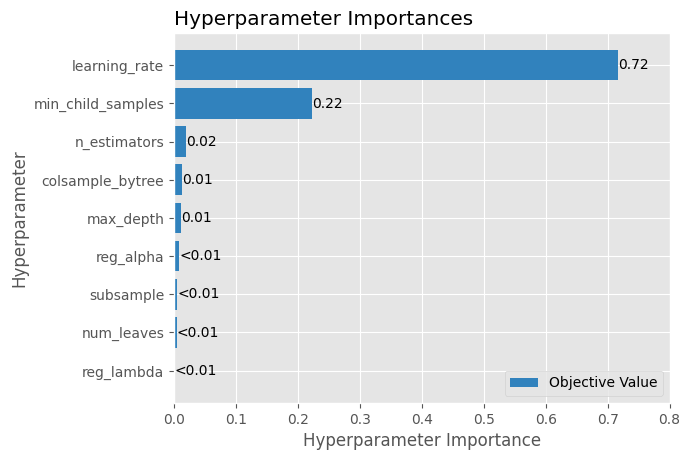

C:\Users\mukti\AppData\Local\Temp\ipykernel_9004\1838663870.py:77: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_optimization_history(study)


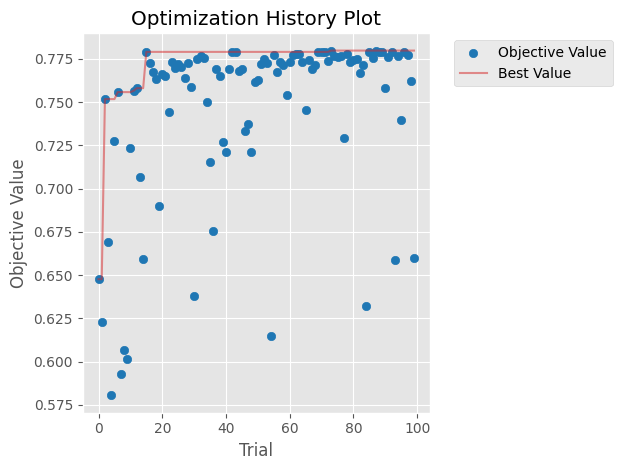

In [7]:
# Step 6: Optuna objective function for LightGBM

def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    num_leaves = trial.suggest_int('num_leaves', 20, 150)
    min_child_samples = trial.suggest_int('min_child_samples', 10, 100)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True)  # L1 regularization
    reg_lambda = trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True)  # L2 regularization

    # Log trial parameters
    params = {
        'n_estimators': n_estimators,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'num_leaves': num_leaves,
        'min_child_samples': min_child_samples,
        'colsample_bytree': colsample_bytree,
        'subsample': subsample,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda
    }
    
    
    # validation split INSIDE Optuna
    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train_vec, y_train, test_size=0.2, random_state=42, stratify=y_train
    )

     # convert both splits to float32
    X_tr  = X_tr.astype(np.float32)
    X_val = X_val.astype(np.float32)

    # Create LightGBM model
    model = LGBMClassifier(**params,
                           random_state=42,
                           objective="multiclass",   
                           num_class=3 
      )
    # Train on X_tr and evaluate on X_val
    model.fit(X_tr, y_tr)
    y_val_pred = model.predict(X_val)
    val_acc = accuracy_score(y_val, y_val_pred)

    # FIXED: Log each trial in MLflow without retraining full data
    log_mlflow_trial("LightGBM", params, val_acc, trial.number)

    return val_acc

# Step 7: Run Optuna for LightGBM, log the best model, and plot the importance of each parameter
def run_optuna_experiment(n_trials=100):
    study = optuna.create_study(direction="maximize")
    study.optimize(objective_lightgbm, n_trials=n_trials)  # Increased to 100 trials

    # Get the best parameters
    best_params = study.best_params

    best_model = LGBMClassifier(**best_params,
                                random_state=42,
                                objective="multiclass",
                                num_class=3)
    
    best_model.fit(X_train_vec, y_train)
    
    # Log the best model with MLflow, passing the algo_name as "lightgbm"
    log_mlflow_best("LightGBM", best_model, X_train_vec, X_test_vec, y_train, y_test,best_params)

    #plot parameter importance
    vis.plot_param_importances(study)
    plt.show()

    #plot optimization history
    vis.plot_optimization_history(study)
    plt.show()

# Run the experiment for LightGBM
run_optuna_experiment()



